# HW3

# 1. The LASSO and Boosting for Regression

In [1]:
import sys
import pandas as pd
import numpy as np
import re
import glob
import matplotlib.pyplot as plt

from sklearn.linear_model import RidgeCV, Lasso, LassoCV
from sklearn.preprocessing import normalize, Imputer

## b. Data Processing:

retreive data from the data file, do the imputation work on this data set, and break it into training data and test data

In [2]:
file_name = "C:/Users/admin/Desktop/MachineLearning/Machine-Learning/HW/HW3/data/communities_data.csv"
reading_file = glob.glob(file_name)[0]
df = pd.read_csv(reading_file,header=None)
df = df.drop(columns=[0,1,2,3,4])

for col in df.columns:
    temp = df[col]
    for row in range(temp.size):
        if temp.values[row] != "?":
            temp.values[row] = float (temp.values[row])
        else:
            temp.values[row] = np.nan

fill_NaN = Imputer(missing_values=np.nan, strategy='mean', axis=0)
imputed_data_all = pd.DataFrame(fill_NaN.fit_transform(df))
imputed_data_all.columns = df.columns
imputed_data_all.index = df.index

training_set = imputed_data_all.iloc[:1495,:]
test_set = imputed_data_all.iloc[1495:,:]

In [7]:
imputed_data_all

,5,6,7,8,9,10,11,12,13,14,...,118,119,120,121,122,123,124,125,126,127
0,0.19,0.33,0.02,0.90,0.12,0.17,0.34,0.47,0.29,0.32,...,0.12,0.26,0.20,0.060000,0.040000,0.900000,0.500000,0.32,0.140000,0.20
1,0.00,0.16,0.12,0.74,0.45,0.07,0.26,0.59,0.35,0.27,...,0.02,0.12,0.45,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.67
2,0.00,0.42,0.49,0.56,0.17,0.04,0.39,0.47,0.28,0.32,...,0.01,0.21,0.02,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.43
3,0.04,0.77,1.00,0.08,0.12,0.10,0.51,0.50,0.34,0.21,...,0.02,0.39,0.28,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.12
4,0.01,0.55,0.02,0.95,0.09,0.05,0.38,0.38,0.23,0.36,...,0.04,0.09,0.02,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.03
5,0.02,0.28,0.06,0.54,1.00,0.25,0.31,0.48,0.27,0.37,...,0.01,0.58,0.10,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.14
6,0.01,0.39,0.00,0.98,0.06,0.02,0.30,0.37,0.23,0.60,...,0.05,0.08,0.06,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.03
7,0.01,0.74,0.03,0.46,0.20,1.00,0.52,0.55,0.36,0.35,...,0.01,0.33,0.00,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.55
8,0.03,0.34,0.20,0.84,0.02,0.00,0.38,0.45,0.28,0.48,...,0.04,0.17,0.04,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.53
9,0.01,0.40,0.06,0.87,0.30,0.03,0.90,0.82,0.80,0.39,...,0.00,0.47,0.11,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.15


In [8]:
training_set

,5,6,7,8,9,10,11,12,13,14,...,118,119,120,121,122,123,124,125,126,127
0,0.19,0.33,0.02,0.90,0.12,0.17,0.34,0.47,0.29,0.32,...,0.12,0.26,0.20,0.060000,0.040000,0.900000,0.500000,0.32,0.140000,0.20
1,0.00,0.16,0.12,0.74,0.45,0.07,0.26,0.59,0.35,0.27,...,0.02,0.12,0.45,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.67
2,0.00,0.42,0.49,0.56,0.17,0.04,0.39,0.47,0.28,0.32,...,0.01,0.21,0.02,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.43
3,0.04,0.77,1.00,0.08,0.12,0.10,0.51,0.50,0.34,0.21,...,0.02,0.39,0.28,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.12
4,0.01,0.55,0.02,0.95,0.09,0.05,0.38,0.38,0.23,0.36,...,0.04,0.09,0.02,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.03
5,0.02,0.28,0.06,0.54,1.00,0.25,0.31,0.48,0.27,0.37,...,0.01,0.58,0.10,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.14
6,0.01,0.39,0.00,0.98,0.06,0.02,0.30,0.37,0.23,0.60,...,0.05,0.08,0.06,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.03
7,0.01,0.74,0.03,0.46,0.20,1.00,0.52,0.55,0.36,0.35,...,0.01,0.33,0.00,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.55
8,0.03,0.34,0.20,0.84,0.02,0.00,0.38,0.45,0.28,0.48,...,0.04,0.17,0.04,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.53
9,0.01,0.40,0.06,0.87,0.30,0.03,0.90,0.82,0.80,0.39,...,0.00,0.47,0.11,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.15


In [9]:
test_set

,5,6,7,8,9,10,11,12,13,14,...,118,119,120,121,122,123,124,125,126,127
1495,0.00,0.20,0.03,0.91,0.23,0.05,0.15,0.19,0.09,0.42,...,0.01,0.23,0.73,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.12
1496,0.00,0.55,0.13,0.78,0.15,0.36,0.48,0.53,0.30,0.10,...,0.01,0.18,0.02,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.11
1497,0.00,0.52,0.04,0.59,0.05,0.62,0.84,0.78,0.75,0.43,...,0.01,0.18,0.00,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.12
1498,0.04,0.51,0.07,0.92,0.09,0.03,0.38,0.47,0.27,0.35,...,0.06,0.13,0.16,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.06
1499,0.03,0.59,0.20,0.75,0.19,0.10,0.38,0.62,0.35,0.11,...,0.03,0.23,0.06,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.12
1500,0.01,0.48,0.02,0.77,0.84,0.05,0.37,0.26,0.20,0.50,...,0.01,0.23,0.05,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.04
1501,0.05,0.64,0.03,0.84,0.21,0.33,0.45,0.50,0.30,0.24,...,0.02,0.39,0.00,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.25
1502,0.27,0.37,0.22,0.67,0.42,0.07,0.39,0.50,0.33,0.42,...,0.14,0.31,0.22,0.250000,0.090000,0.840000,1.000000,0.45,0.210000,0.76
1503,0.00,0.24,0.01,0.95,0.01,0.01,0.22,0.23,0.13,1.00,...,0.06,0.04,0.03,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.15
1504,0.02,0.32,0.20,0.81,0.08,0.05,0.28,0.43,0.26,0.59,...,0.02,0.26,0.09,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.14


## c. plot the correlation matrix

In [10]:
imputed_data_all_featrues = imputed_data_all.drop(columns=[127])
corr = imputed_data_all_featrues.corr()
corr.style.background_gradient()

## d. coeffient of variation CV for each feature

In [12]:
feature_variance = imputed_data_all_featrues.var(axis=0)
feature_mean = imputed_data_all_featrues.mean(axis=0)
coeffient_variation = feature_variance.divide(feature_mean, axis=0)

In [13]:
coeffient_variation

5      0.279637
6      0.057841
7      0.357587
8      0.079015
9      0.283898
10     0.375306
11     0.056777
12     0.041733
13     0.082446
14     0.075875
15     0.256736
16     0.284167
17     0.121379
18     0.059942
19     0.142881
20     0.063970
21     0.063981
22     0.155280
23     0.058587
24     0.104626
25     0.104275
26     0.094813
27     0.101149
28     0.133416
29     0.118457
30     0.128067
31     0.086773
32     0.294900
33     0.172265
34     0.144146
         ...   
97     0.068567
98     0.061468
99     0.064188
100    0.060307
101    0.043774
102    0.018767
103    0.003018
104    0.015571
105    0.042694
106    0.020093
107    0.018053
108    0.018767
109    0.011906
110    0.010760
111    0.040401
112    0.045539
113    0.071802
114    0.031347
115    0.030490
116    0.011846
117    0.026843
118    0.183676
119    0.177134
120    0.324496
121    0.045127
122    0.040890
123    0.010454
124    0.059659
125    0.614103
126    0.022192
Length: 122, dtype: floa

## e. scatter plots and box plots for 11 features with the highest CV

### a. scatter plot

In [15]:
def find_highest_headers(coeffient_variation):
    coeffient_variation_sort = coeffient_variation.sort_values(ascending=False)
    features_with_largest_CV_headers = []
    count = 0
    while count < 11:
        features_with_largest_CV_headers.append(coeffient_variation_sort.index[count])
        count += 1
    return features_with_largest_CV_headers

features_with_largest_CV_headers = find_highest_headers(coeffient_variation)

In [19]:
scatter_plot_data = pd.DataFrame(imputed_data_all_featrues, columns=features_with_largest_CV_headers)
scatter_plot_data.index = imputed_data_all_featrues.index
scatter_plot_data.columns = ["LemasPctOfficDrugUn","NumStreet","racePctHisp","NumInShelters",
                             "racepctblack","NumIlleg","PctUsePubTrans","PctNotSpeakEnglWell",
                             "PctRecImmig5","PctRecentImmig","PctRecImmig8"]

d:\python\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: pandas.scatter_matrix is deprecated, use pandas.plotting.scatter_matrix instead
  """Entry point for launching an IPython kernel.


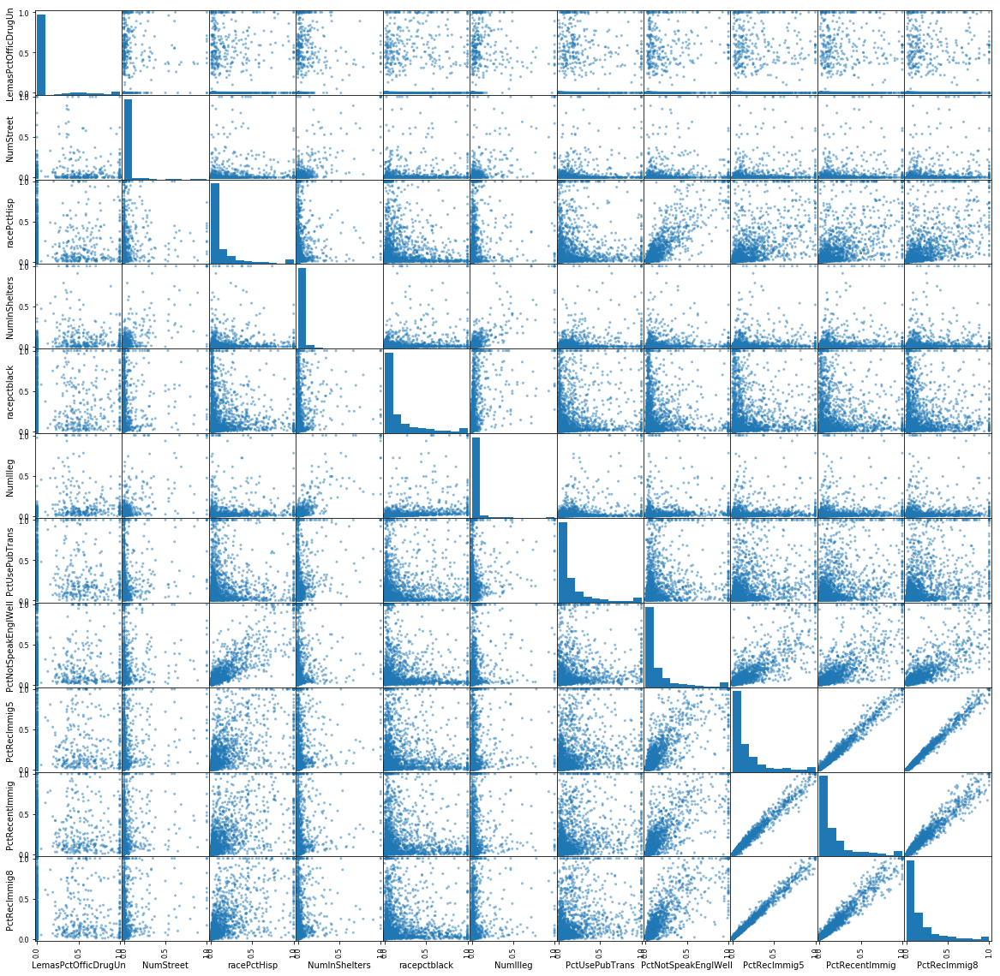

In [21]:
pd.scatter_matrix(scatter_plot_data, figsize=(20,20))
plt.show()

### b. box plot

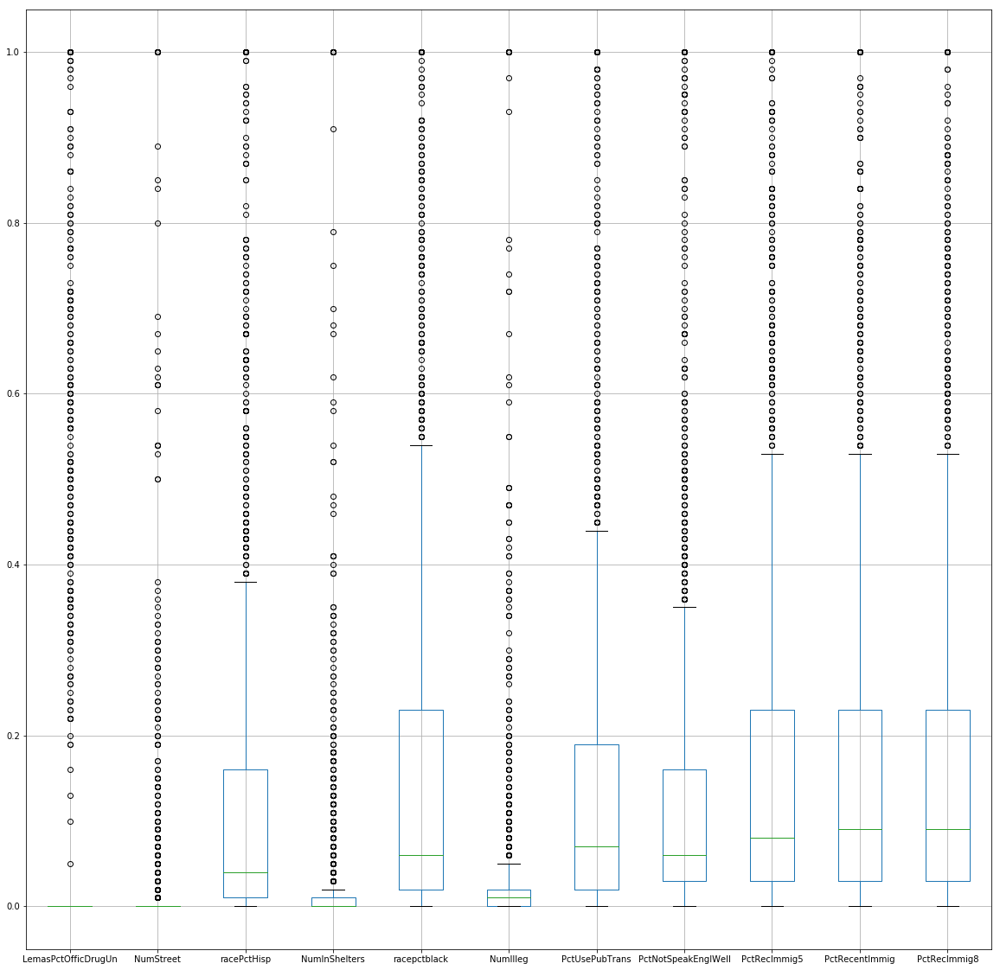

In [24]:
scatter_plot_data.boxplot(figsize=(20,20))

### conclusion about the significance of those features:
There is some linear relation between these following pairs, PctRecImmig5 and PctRecentImmig, PctRecImmig5 and PctRecImmig8, PctRecImmig8 and PctRecentImmig.

## f. fit a linear model

In [6]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

training_set_x = training_set.drop(columns=[127]).values
training_set_y = training_set[127].values
test_set_x = test_set.drop(columns=[127]).values
test_set_y = test_set[127].values

In [21]:
linear_regression_model = LinearRegression()
linear_regression_model.fit(training_set_x, training_set_y)
linear_regression_predict_y = linear_regression_model.predict(test_set_x)
linear_regression_R = linear_regression_model.score(test_set_x, test_set_y)
linear_regression_test_error = mean_squared_error(test_set_y, linear_regression_predict_y)

test error:

In [8]:
linear_regression_test_error

0.7897255274340215

R**2 for linear regression model

In [22]:
linear_regression_R

-15.60646695076333

## g. ridge regression model

In [9]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import cross_val_score

In [10]:
alpha = np.logspace(-4, 2, num=15)
ridge_regression_R = []
for item in alpha:
    ridge_regression_model = Ridge(alpha=item, normalize=True)
    ridge_regression_model.fit(training_set_x, training_set_y)
    ridge_regression_R.append(np.mean(cross_val_score(ridge_regression_model, test_set_x, test_set_y, cv=10)))

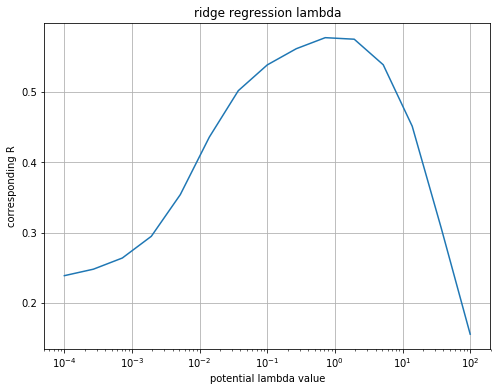

In [17]:
plt.figure(num=1, figsize=(8,6))
plt.plot(alpha, ridge_regression_R)
plt.xscale('log')
plt.xlabel('potential lambda value')
plt.ylabel('corresponding R')
plt.title('ridge regression lambda')
plt.grid(True)

from the picture above, we can tell that the best lambda value might be 1

In [25]:
ridge_regression_model = Ridge(alpha=1, normalize=True)
ridge_regression_model.fit(training_set_x, training_set_y)
ridge_regression_predict_y = ridge_regression_model.predict(test_set_x)
ridge_regression_R = ridge_regression_model.score(test_set_x, test_set_y)
ridge_regression_test_error = mean_squared_error(test_set_y, ridge_regression_predict_y)

test error:

In [26]:
ridge_regression_test_error

0.017484545658574418

R**2 for ridge regression model

In [27]:
ridge_regression_R

0.6323323489723628

## h. LASSO model

### a. unormalized

In [23]:
lasso_R = []
for item in alpha:
    lasso_model = Lasso(alpha=item, normalize=False)
    lasso_model.fit(training_set_x, training_set_y)
    lasso_R.append(np.mean(cross_val_score(lasso_model, test_set_x, test_set_y, cv=10)))

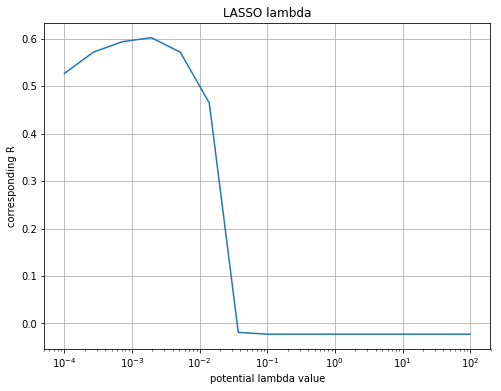

In [24]:
plt.figure(num=2, figsize=(8,6))
plt.plot(alpha, lasso_R)
plt.xscale('log')
plt.xlabel('potential lambda value')
plt.ylabel('corresponding R')
plt.title('LASSO lambda')
plt.grid(True)

from the picture above, the best lambda might be 1.9e-3

In [31]:
lasso_model = Lasso(alpha=1.9e-3, normalize=False)
lasso_model.fit(training_set_x, training_set_y)
lasso_predict_y = lasso_model.predict(test_set_x)
lasso_R = lasso_model.score(test_set_x, test_set_y)
lasso_test_error = mean_squared_error(test_set_y, lasso_predict_y)

LASSO test error:

In [32]:
lasso_test_error

0.017712742023735115

LASSO R**2

In [33]:
lasso_R

0.6275338015471094

### b. normalized

In [34]:
lasso_R = []
for item in alpha:
    lasso_model = Lasso(alpha=item, normalize=True)
    lasso_model.fit(training_set_x, training_set_y)
    lasso_R.append(np.mean(cross_val_score(lasso_model, test_set_x, test_set_y, cv=10)))

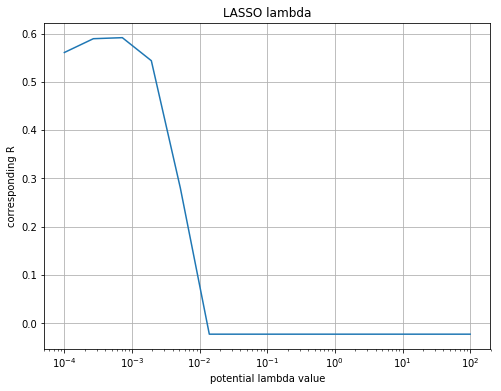

In [35]:
plt.figure(num=3, figsize=(8,6))
plt.plot(alpha, lasso_R)
plt.xscale('log')
plt.xlabel('potential lambda value')
plt.ylabel('corresponding R')
plt.title('LASSO lambda')
plt.grid(True)

from the picture above, lambda might be 7e-4

In [36]:
lasso_model = Lasso(alpha=7e-4, normalize=False)
lasso_model.fit(training_set_x, training_set_y)
lasso_predict_y = lasso_model.predict(test_set_x)
lasso_R = lasso_model.score(test_set_x, test_set_y)
lasso_test_error = mean_squared_error(test_set_y, lasso_predict_y)

LASSO test error:

In [37]:
lasso_test_error

0.01756128833351486

LASSO R**2:

In [38]:
lasso_R

0.6307185924824941

As we can see from the two cases above, LASSO results after normalization will be slightly better.

## i. PCR model

In [40]:
from sklearn.decomposition import PCA

In [43]:
potential_components = np.linspace(112,121,10,dtype=int)
pca_model_R = []
for num in potential_components:
    pca_model = PCA(n_components=num)
    new_train_set_x = pca_model.fit_transform(training_set_x)
    new_test_set_x = pca_model.transform(test_set_x)
    linear_regression_model = LinearRegression()
    linear_regression_model.fit(new_train_set_x, training_set_y)
    pca_model_R.append(np.mean(cross_val_score(linear_regression_model, new_test_set_x, test_set_y, cv=10)))

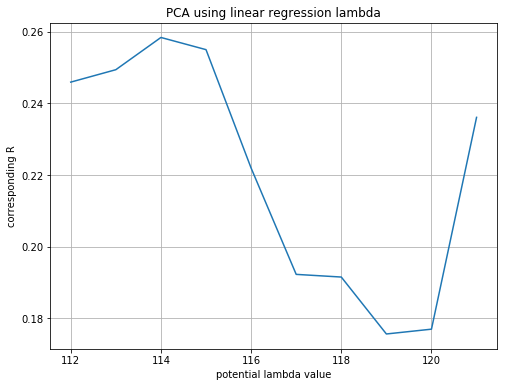

In [44]:
plt.figure(num=4, figsize=(8,6))
plt.plot(potential_components, pca_model_R)
plt.xlabel('potential lambda value')
plt.ylabel('corresponding R')
plt.title('PCA using linear regression lambda')
plt.grid(True)

The best PCA components number might be 114

In [46]:
pca_model = PCA(n_components=114)
new_train_set_x = pca_model.fit_transform(training_set_x)
new_test_set_x = pca_model.transform(test_set_x)
linear_regression_model = LinearRegression()
linear_regression_model.fit(new_train_set_x, training_set_y)
linear_regression_predict_y = linear_regression_model.predict(new_test_set_x)
linear_regression_R = linear_regression_model.score(new_test_set_x, test_set_y)
linear_regression_test_error = mean_squared_error(test_set_y, linear_regression_predict_y)

Linear regression test error:

In [47]:
linear_regression_test_error

0.018085792313808302

## j. Boosting tree

In [48]:
import xgboost as xgb

In [49]:
alphas = np.logspace(-4, 2, num=15)
xgb_R = []
for num in alphas:
    xgb_model = xgb.XGBRegressor(reg_alpha=num, reg_lambda=0)
    xgb_model.fit(training_set_x, training_set_y)
    xgb_R.append(np.mean(cross_val_score(xgb_model, test_set_x, test_set_y, cv=10)))

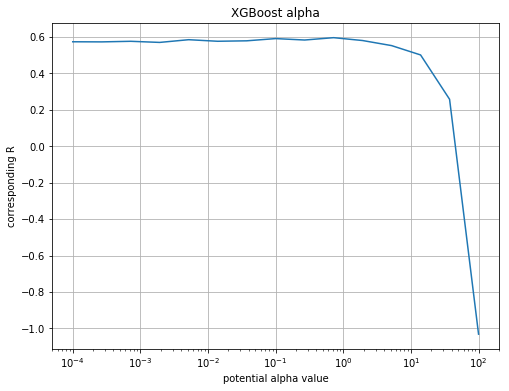

In [50]:
plt.figure(num=5, figsize=(8,6))
plt.plot(alphas, xgb_R)
plt.xscale('log')
plt.xlabel('potential alpha value')
plt.ylabel('corresponding R')
plt.title('XGBoost alpha')
plt.grid(True)

from the picture, we can see the choose alpha value can be 1e-1

In [51]:
xgb_model = xgb.XGBRegressor(reg_alpha=1e-1, reg_lambda=0)
xgb_model.fit(training_set_x, training_set_y)
xgb_predict_test_y = xgb_model.predict(test_set_x)
xgb_R = xgb_model.score(test_set_x, test_set_y)
xgb_test_error = mean_squared_error(test_set_y, xgb_predict_test_y)

XGBoost test error:

In [52]:
xgb_test_error

0.01691037602895298

XGBoost R**2:

In [53]:
xgb_R

0.6444060741429563

# 2. Tree-Based Methods

## a&b. Data Processing

In [24]:
import pandas as pd
import numpy as np
import glob

In [25]:
from sklearn.preprocessing import Imputer

In [46]:
training_file_name = "C:/Users/admin/Desktop/MachineLearning/Machine-Learning/HW/HW3/data/aps_failure_training_set.csv"
test_file_name = "C:/Users/admin/Desktop/MachineLearning/Machine-Learning/HW/HW3/data/aps_failure_test_set.csv"

reading_training_file = glob.glob(training_file_name)[0]
training_data_frame = pd.read_csv(reading_training_file,header=0)
test_training_file = glob.glob(test_file_name)[0]
test_data_frame = pd.read_csv(test_training_file,header=0)

In [45]:
def imputer_x_data_process(df):
    for col in df.columns:
        temp = df[col]
        for row in range(temp.size):
            if temp.values[row] != "na":
                temp.values[row] = float (temp.values[row])
            else:
                temp.values[row] = np.nan

    fill_NaN = Imputer(missing_values=np.nan, strategy='median', axis=0)
    imputed_data_all = pd.DataFrame(fill_NaN.fit_transform(df))
    imputed_data_all.columns = df.columns
    imputed_data_all.index = df.index
    return imputed_data_all

def imputer_y_data_process(df):
    for row in range(df.size):
        if df.values[row] == "neg":
            df.values[row] = 0
        else:
            df.values[row] = 1
    return df

### Read data, using median of the feature when facing missing data

In [47]:
training_data_y = imputer_y_data_process(training_data_frame["class"])
test_data_y = imputer_y_data_process(test_data_frame["class"])
training_data_x = imputer_x_data_process(training_data_frame.drop(columns=["class"]))
test_data_x = imputer_x_data_process(test_data_frame.drop(columns=["class"]))

In [6]:
training_data_x

,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,76698.0,0.0,2.130706e+09,280.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1240520.0,493384.0,721044.0,469792.0,339156.0,157956.0,73224.0,0.0,0.0,0.0
1,33058.0,0.0,0.000000e+00,126.0,0.0,0.0,0.0,0.0,0.0,0.0,...,421400.0,178064.0,293306.0,245416.0,133654.0,81140.0,97576.0,1500.0,0.0,0.0
2,41040.0,0.0,2.280000e+02,100.0,0.0,0.0,0.0,0.0,0.0,0.0,...,277378.0,159812.0,423992.0,409564.0,320746.0,158022.0,95128.0,514.0,0.0,0.0
3,12.0,0.0,7.000000e+01,66.0,0.0,10.0,0.0,0.0,0.0,318.0,...,240.0,46.0,58.0,44.0,10.0,0.0,0.0,0.0,4.0,32.0
4,60874.0,0.0,1.368000e+03,458.0,0.0,0.0,0.0,0.0,0.0,0.0,...,622012.0,229790.0,405298.0,347188.0,286954.0,311560.0,433954.0,1218.0,0.0,0.0
5,38312.0,0.0,2.130706e+09,218.0,0.0,0.0,0.0,0.0,0.0,0.0,...,388574.0,288278.0,900430.0,300412.0,1534.0,338.0,856.0,0.0,0.0,0.0
6,14.0,0.0,6.000000e+00,126.0,0.0,0.0,0.0,0.0,0.0,0.0,...,168.0,48.0,60.0,28.0,0.0,0.0,0.0,0.0,0.0,0.0
7,102960.0,0.0,2.130706e+09,116.0,0.0,0.0,0.0,0.0,0.0,0.0,...,715518.0,384948.0,915978.0,1052166.0,1108672.0,341532.0,129504.0,7832.0,0.0,0.0
8,78696.0,0.0,0.000000e+00,126.0,0.0,0.0,0.0,0.0,0.0,0.0,...,699290.0,362510.0,1190028.0,1012704.0,160090.0,63216.0,41202.0,4.0,0.0,0.0
9,153204.0,0.0,1.820000e+02,126.0,0.0,0.0,0.0,0.0,0.0,11804.0,...,129862.0,26872.0,34044.0,22472.0,34362.0,0.0,0.0,0.0,0.0,0.0


In [41]:
training_data_y

0        -1
1        -1
2        -1
3        -1
4        -1
5        -1
6        -1
7        -1
8        -1
9         1
10       -1
11       -1
12       -1
13       -1
14       -1
15       -1
16       -1
17       -1
18       -1
19       -1
20       -1
21       -1
22       -1
23        1
24       -1
25       -1
26       -1
27       -1
28       -1
29       -1
         ..
59970    -1
59971    -1
59972    -1
59973    -1
59974    -1
59975    -1
59976    -1
59977    -1
59978    -1
59979    -1
59980    -1
59981    -1
59982    -1
59983    -1
59984    -1
59985    -1
59986    -1
59987    -1
59988    -1
59989    -1
59990    -1
59991    -1
59992    -1
59993    -1
59994    -1
59995    -1
59996    -1
59997    -1
59998    -1
59999    -1
Name: class, Length: 60000, dtype: object

In [8]:
test_data_x

,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,60.0,0.0,2.000000e+01,12.0,0.0,0.0,0.0,0.0,0.0,2682.0,...,1098.0,138.0,412.0,654.0,78.0,88.0,0.0,0.0,0.0,0.0
1,82.0,0.0,6.800000e+01,40.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1068.0,276.0,1620.0,116.0,86.0,462.0,0.0,0.0,0.0,0.0
2,66002.0,2.0,2.120000e+02,112.0,0.0,0.0,0.0,0.0,0.0,199486.0,...,495076.0,380368.0,440134.0,269556.0,1315022.0,153680.0,516.0,0.0,0.0,0.0
3,59816.0,0.0,1.010000e+03,936.0,0.0,0.0,0.0,0.0,0.0,0.0,...,540820.0,243270.0,483302.0,485332.0,431376.0,210074.0,281662.0,3232.0,0.0,0.0
4,1814.0,0.0,1.560000e+02,140.0,0.0,0.0,0.0,0.0,0.0,0.0,...,7646.0,4144.0,18466.0,49782.0,3176.0,482.0,76.0,0.0,0.0,0.0
5,174.0,0.0,2.600000e+01,24.0,0.0,0.0,0.0,0.0,0.0,0.0,...,240986.0,114780.0,229708.0,195651.0,96570.0,42013.0,3985.0,0.0,0.0,0.0
6,40202.0,0.0,6.400000e+02,606.0,0.0,0.0,0.0,0.0,0.0,0.0,...,526218.0,239734.0,439556.0,374248.0,169096.0,53658.0,41054.0,320.0,0.0,0.0
7,120278.0,0.0,2.130706e+09,256.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1006722.0,459658.0,876356.0,689532.0,568540.0,500624.0,1006628.0,34820.0,0.0,0.0
8,14592.0,0.0,2.130706e+09,162.0,0.0,0.0,0.0,0.0,0.0,0.0,...,105024.0,57398.0,49152.0,38256.0,243268.0,145144.0,0.0,0.0,0.0,0.0
9,28338.0,0.0,2.130706e+09,238.0,0.0,0.0,0.0,0.0,0.0,0.0,...,357006.0,150056.0,264776.0,239282.0,140548.0,74750.0,32958.0,84.0,0.0,0.0


In [9]:
test_data_y

0        -1
1        -1
2        -1
3        -1
4        -1
5        -1
6        -1
7        -1
8        -1
9        -1
10       -1
11       -1
12       -1
13       -1
14       -1
15       -1
16       -1
17       -1
18       -1
19       -1
20       -1
21       -1
22       -1
23       -1
24       -1
25       -1
26       -1
27       -1
28       -1
29       -1
         ..
15970    -1
15971    -1
15972    -1
15973    -1
15974    -1
15975    -1
15976    -1
15977    -1
15978    -1
15979    -1
15980    -1
15981    -1
15982    -1
15983    -1
15984    -1
15985    -1
15986    -1
15987    -1
15988    -1
15989    -1
15990    -1
15991    -1
15992    -1
15993    -1
15994     1
15995    -1
15996    -1
15997    -1
15998    -1
15999    -1
Name: class, Length: 16000, dtype: object

### coefficient of variation

In [7]:
feature_variance_training_set = training_data_x.var(axis=0)
feature_mean_training_set = training_data_x.mean(axis=0)
coeffient_variation_training_set = feature_variance_training_set.divide(feature_mean_training_set, axis=0)

In [11]:
coeffient_variation_training_set

aa_000    3.564400e+05
ab_000    1.752025e+01
ac_000    1.794508e+09
ad_000    8.562354e+09
ae_000    3.827201e+03
af_000    3.999153e+03
ag_000    1.892144e+06
ag_001    1.198791e+06
ag_002    2.625784e+06
ag_003    6.550555e+06
ag_004    1.290053e+07
ag_005    9.595340e+06
ag_006    9.164319e+06
ag_007    4.046424e+06
ag_008    1.362172e+06
ag_009    5.627678e+06
ah_000    9.626095e+06
ai_000    2.956705e+06
aj_000    2.217513e+06
ak_000    5.870910e+06
al_000    4.922347e+06
am_0      7.736696e+06
an_000    1.743788e+07
ao_000    1.541174e+07
ap_000    9.467081e+06
aq_000    3.589807e+06
ar_000    6.115591e+01
as_000    9.564817e+05
at_000    2.820999e+06
au_000    1.082596e+06
              ...     
dl_000    4.206215e+07
dm_000    9.722060e+06
dn_000    2.795103e+05
do_000    1.298927e+05
dp_000    2.763670e+04
dq_000    2.098348e+09
dr_000    9.167741e+06
ds_000    4.723526e+05
dt_000    7.245829e+04
du_000    3.306544e+07
dv_000    7.312876e+06
dx_000    2.181407e+07
dy_000    4

In [12]:
feature_variance_test_set = test_data_x.var(axis=0)
feature_mean_test_set = test_data_x.mean(axis=0)
coeffient_variation_test_set = feature_variance_test_set.divide(feature_mean_test_set, axis=0)

In [13]:
coeffient_variation_test_set

aa_000    3.728804e+06
ab_000    9.278071e+00
ac_000    1.793498e+09
ad_000    5.036501e+03
ae_000    2.173153e+03
af_000    2.744273e+03
ag_000    3.447236e+05
ag_001    3.859598e+06
ag_002    4.032881e+06
ag_003    9.344976e+06
ag_004    1.592412e+07
ag_005    1.128187e+07
ag_006    9.665174e+06
ag_007    3.824470e+06
ag_008    1.630771e+06
ag_009    5.078964e+06
ah_000    1.076664e+07
ai_000    4.369115e+06
aj_000    2.120760e+06
ak_000    8.822085e+06
al_000    5.946959e+06
am_0      9.149331e+06
an_000    1.950718e+07
ao_000    1.728262e+07
ap_000    1.086844e+07
aq_000    3.997794e+06
ar_000    4.432778e+01
as_000    4.793596e+06
at_000    2.831765e+06
au_000    4.042471e+06
              ...     
dl_000    4.827755e+07
dm_000    1.127536e+07
dn_000    3.048430e+05
do_000    1.799336e+05
dp_000    3.556204e+04
dq_000    1.821315e+09
dr_000    9.533778e+06
ds_000    5.331958e+05
dt_000    8.193668e+04
du_000    3.666875e+07
dv_000    8.396539e+06
dx_000    2.080104e+07
dy_000    5

### correlation matrix

In [14]:
corr = training_data_x.corr()
corr.style.background_gradient()

d:\python\lib\site-packages\matplotlib\colors.py:504: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


### Scatter plots and box plots

In [1]:
import matplotlib.pyplot as plt

In [8]:
def find_highest_headers(coeffient_variation):
    coeffient_variation_sort = coeffient_variation.sort_values(ascending=False)
    features_with_largest_CV_headers = []
    count = 0
    while count < 13:
        features_with_largest_CV_headers.append(coeffient_variation_sort.index[count])
        count += 1
    return features_with_largest_CV_headers

features_with_largest_CV_headers = find_highest_headers(coeffient_variation_training_set)

In [9]:
scatter_plot_data = pd.DataFrame(training_data_x, columns=features_with_largest_CV_headers)
scatter_plot_data.index = training_data_x.index

d:\python\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: pandas.scatter_matrix is deprecated, use pandas.plotting.scatter_matrix instead
  """Entry point for launching an IPython kernel.


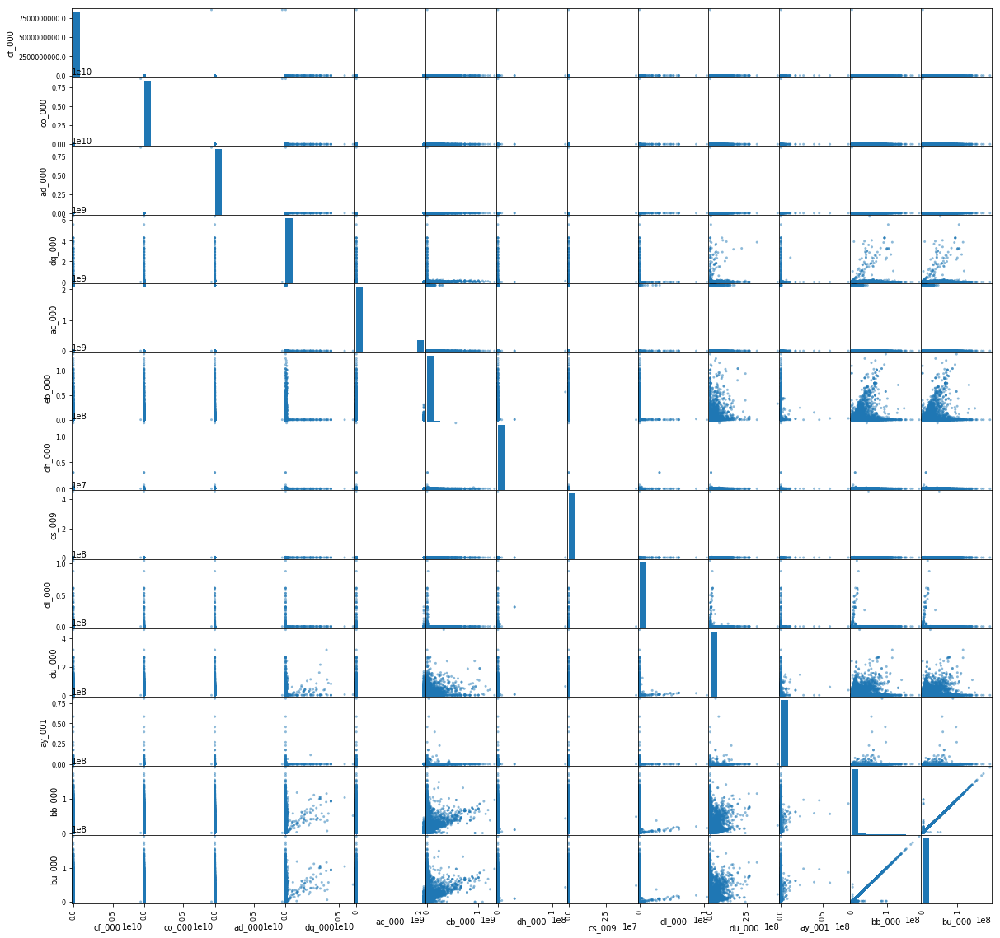

In [10]:
pd.scatter_matrix(scatter_plot_data, figsize=(20,20))
plt.show()

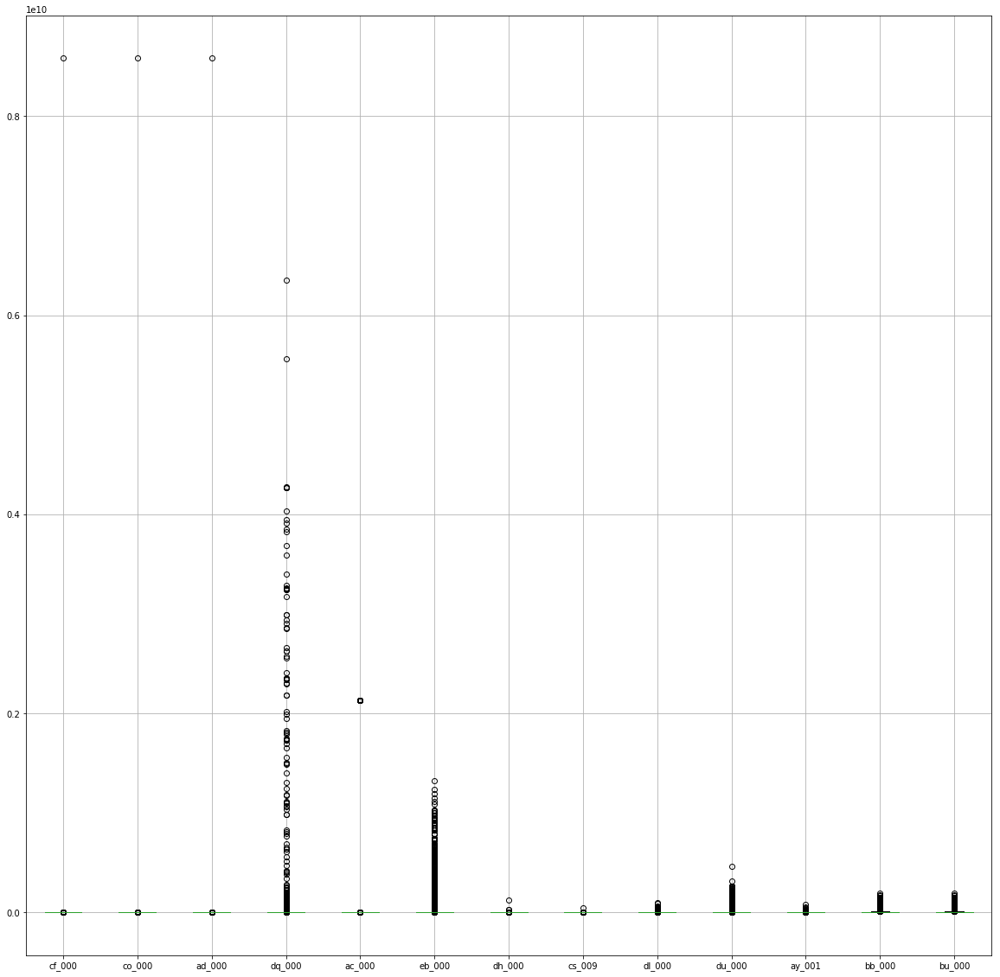

In [11]:
scatter_plot_data.boxplot(figsize=(20,20))

There might be some kind of linear relation between bb_000 and bu_000.

### From the data label value, we can see this data set is imbalanced

## c. random forest model

In [34]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, roc_curve, classification_report, roc_auc_score, auc

In [49]:
training_data_x_np = training_data_x.values
training_data_y_np = training_data_y.values
test_data_x_np = test_data_x.values
test_data_y_np = test_data_y.values

training_data_y_1D = list(training_data_y_np)
test_data_y_1D = list(test_data_y_np)

In [47]:
clf = RandomForestClassifier()
clf.fit(training_data_x_np, training_data_y_1D)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

### training data

In [48]:
training_predict_y = clf.predict(training_data_x_np)

In [49]:
training_matrix = confusion_matrix(training_data_y_1D, training_predict_y)

[[58998     2]
 [   37   963]]


Text(0.5,0,'Predicted label')

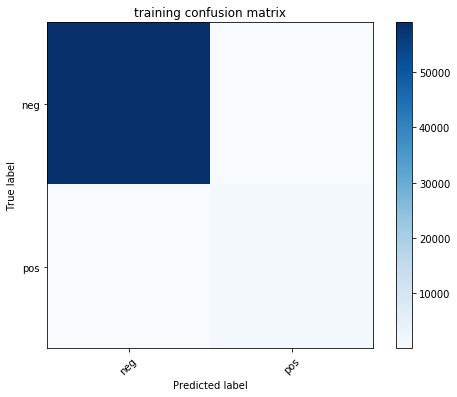

In [51]:
plt.figure(num=6, figsize=(8,6))
print(training_matrix)
plt.imshow(training_matrix, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('training confusion matrix')
plt.colorbar()
classes=["neg","pos"]
tick_marks=np.arange(len(classes))
plt.xticks(tick_marks,classes,rotation=45)
plt.yticks(tick_marks,classes)
plt.ylabel('True label')
plt.xlabel('Predicted label')

In [57]:
fpr_training, tpr_training, thresholds_training = roc_curve(training_data_y_1D, training_predict_y)
roc_auc = auc(fpr_training,tpr_training)

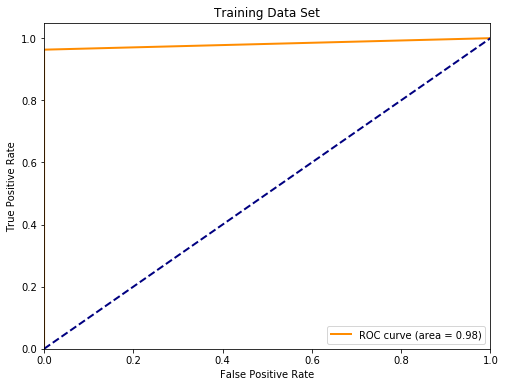

In [60]:
plt.figure(num=7, figsize=(8,6))
plt.plot(fpr_training, tpr_training, color='darkorange',
         lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Training Data Set')
plt.legend(loc="lower right")
plt.show()

In [61]:
print("auc score")
roc_auc_score(training_data_y_1D, training_predict_y)

auc score


0.9814830508474577

In [67]:
print('training error')
training_error = 1 - clf.score(training_data_x_np, training_data_y_1D)
print('%0.5f' % training_error)

training error
0.00065


### test data:

In [68]:
test_predict_y = clf.predict(test_data_x_np)

In [69]:
test_matrix = confusion_matrix(test_data_y_1D, test_predict_y)

[[15603    22]
 [  128   247]]


Text(0.5,0,'Predicted label')

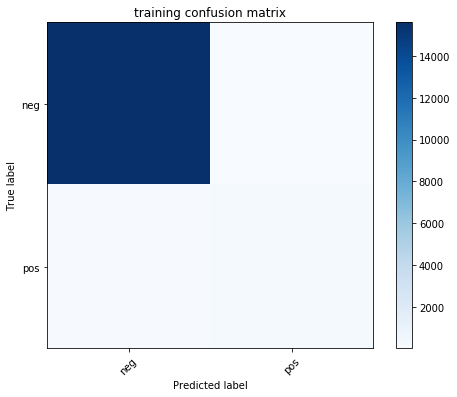

In [70]:
plt.figure(num=8, figsize=(8,6))
print(test_matrix)
plt.imshow(test_matrix, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('training confusion matrix')
plt.colorbar()
classes=["neg","pos"]
tick_marks=np.arange(len(classes))
plt.xticks(tick_marks,classes,rotation=45)
plt.yticks(tick_marks,classes)
plt.ylabel('True label')
plt.xlabel('Predicted label')

In [71]:
fpr_test, tpr_test, thresholds_test = roc_curve(test_data_y_1D, test_predict_y)
roc_auc_test = auc(fpr_test,tpr_test)

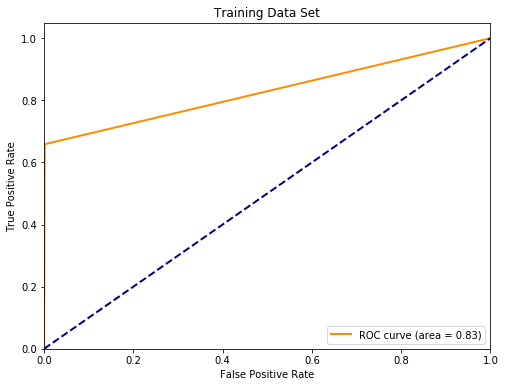

In [72]:
plt.figure(num=9, figsize=(8,6))
plt.plot(fpr_test, tpr_test, color='darkorange',
         lw=2, label='ROC curve (area = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Training Data Set')
plt.legend(loc="lower right")
plt.show()

In [73]:
print("auc score")
roc_auc_score(test_data_y_1D, test_predict_y)

auc score


0.8286293333333332

In [74]:
print('test error')
test_error = 1 - clf.score(test_data_x_np, test_data_y_1D)
print('%0.5f' % test_error)

test error
0.00938


### Out of Bag error

In [75]:
clf_oob = RandomForestClassifier(oob_score=True)
clf_oob.fit(training_data_x_np, training_data_y_1D)

d:\python\lib\site-packages\sklearn\ensemble\forest.py:453: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
d:\python\lib\site-packages\sklearn\ensemble\forest.py:458: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=True, random_state=None, verbose=0, warm_start=False)

In [76]:
test_predict_y = clf_oob.predict(test_data_x_np)

In [77]:
oob_error = 1 - clf_oob.oob_score_

In [78]:
print('OOB error')
oob_error

OOB error


0.00921666666666665

It can be seen that OOB error is slightly lower than test error.

## d. Compensate for Class imbalance

In random forest, the method add a weight to the class. The weight can be calculated from the number of specific class.

In [79]:
clf_compensate_class_imbalance = RandomForestClassifier(class_weight="balanced")
clf_compensate_class_imbalance.fit(training_data_x_np, training_data_y_1D)

RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='gini', max_depth=None, max_features='auto',
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=10, n_jobs=1, oob_score=False, random_state=None,
            verbose=0, warm_start=False)

### training data set:

In [87]:
training_predict_y = clf_compensate_class_imbalance.predict(training_data_x_np)

In [88]:
training_matrix = confusion_matrix(training_data_y_1D, training_predict_y)

[[58998     2]
 [   44   956]]


Text(0.5,0,'Predicted label')

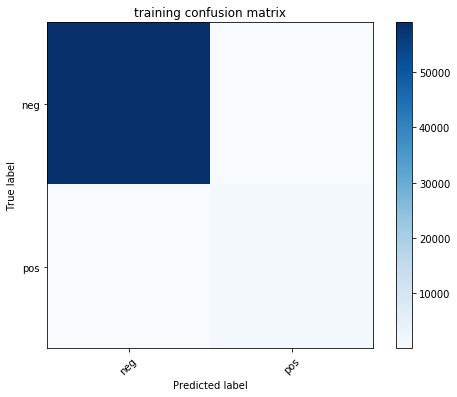

In [89]:
plt.figure(num=12, figsize=(8,6))
print(training_matrix)
plt.imshow(training_matrix, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('training confusion matrix')
plt.colorbar()
classes=["neg","pos"]
tick_marks=np.arange(len(classes))
plt.xticks(tick_marks,classes,rotation=45)
plt.yticks(tick_marks,classes)
plt.ylabel('True label')
plt.xlabel('Predicted label')

In [90]:
fpr_training, tpr_training, thresholds_training = roc_curve(training_data_y_1D, training_predict_y)
roc_auc = auc(fpr_training,tpr_training)

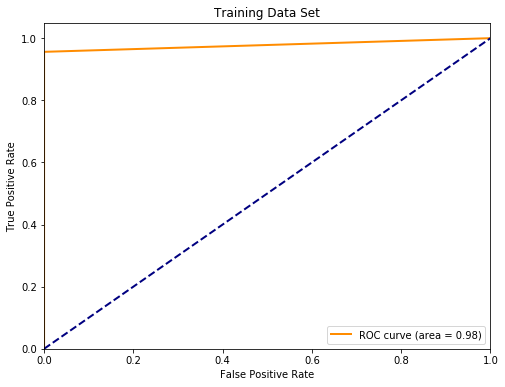

In [91]:
plt.figure(num=13, figsize=(8,6))
plt.plot(fpr_training, tpr_training, color='darkorange',
         lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Training Data Set')
plt.legend(loc="lower right")
plt.show()

In [92]:
print('training error')
training_error = 1 - clf_compensate_class_imbalance.score(training_data_x_np, training_data_y_1D)
print('%0.5f' % training_error)

training error
0.00077


### test data set:

In [80]:
test_predict_y = clf_compensate_class_imbalance.predict(test_data_x_np)

In [81]:
test_matrix_new = confusion_matrix(test_data_y_1D, test_predict_y)

[[15610    15]
 [  170   205]]


Text(0.5,0,'Predicted label')

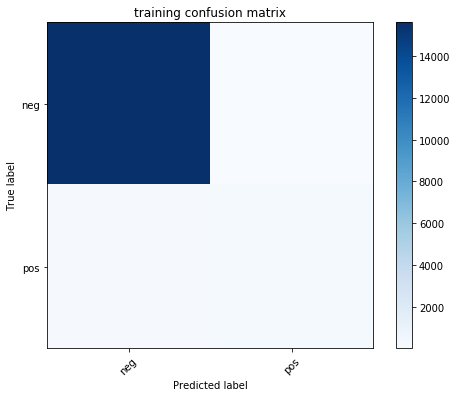

In [82]:
plt.figure(num=10, figsize=(8,6))
print(test_matrix_new)
plt.imshow(test_matrix_new, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('training confusion matrix')
plt.colorbar()
classes=["neg","pos"]
tick_marks=np.arange(len(classes))
plt.xticks(tick_marks,classes,rotation=45)
plt.yticks(tick_marks,classes)
plt.ylabel('True label')
plt.xlabel('Predicted label')

In [83]:
fpr_test, tpr_test, thresholds_test = roc_curve(test_data_y_1D, test_predict_y)
roc_auc_test = auc(fpr_test,tpr_test)

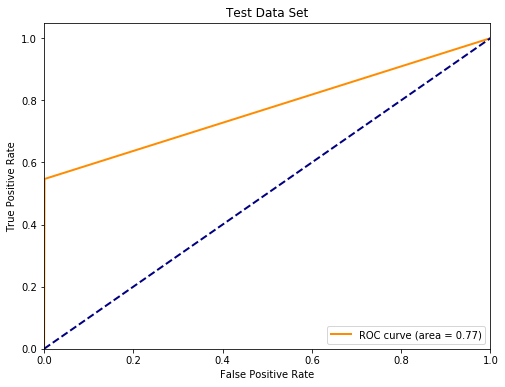

In [86]:
plt.figure(num=11, figsize=(8,6))
plt.plot(fpr_test, tpr_test, color='darkorange',
         lw=2, label='ROC curve (area = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Test Data Set')
plt.legend(loc="lower right")
plt.show()

In [85]:
print('test error')
test_error = 1 - clf_compensate_class_imbalance.score(test_data_x_np, test_data_y_1D)
print('%0.5f' % test_error)

test error
0.01156


Acctually, from the data prediction, we can see the weighted model has less Fasle-Positive but more Fasle-Negative. In conclusion, I would say the result before using weighted model is slightly better.

## e. Model Trees

In [2]:
import weka.core.jvm as jvm
jvm.start(packages=True)

DEBUG:weka.core.jvm:Adding bundled jars
DEBUG:weka.core.jvm:Classpath=['d:\\python\\lib\\site-packages\\javabridge\\jars\\rhino-1.7R4.jar', 'd:\\python\\lib\\site-packages\\javabridge\\jars\\runnablequeue.jar', 'd:\\python\\lib\\site-packages\\javabridge\\jars\\cpython.jar', 'd:\\python\\lib\\site-packages\\weka\\lib\\python-weka-wrapper.jar', 'd:\\python\\lib\\site-packages\\weka\\lib\\weka.jar']
DEBUG:weka.core.jvm:MaxHeapSize=default
DEBUG:weka.core.jvm:Package support enabled
DEBUG:javabridge.jutil:Creating JVM object
DEBUG:javabridge.jutil:Signalling caller


In [3]:
from weka.classifiers import Classifier, Evaluation
from weka.plot.classifiers import plot_roc
from weka.core.converters import Loader
from weka.core.classes import Random

In [4]:
loader = Loader()
training_instances = loader.load_file('C:/Users/admin/Desktop/MachineLearning/Machine-Learning/HW/HW3/data/training_instances.arff')
test_instances = loader.load_file('C:/Users/admin/Desktop/MachineLearning/Machine-Learning/HW/HW3/data/testing_instances.arff')
test_instances.class_is_last()
training_instances.class_is_last()

In [5]:
tree_model = Classifier(classname='weka.classifiers.trees.LMT')
tree_model.build_classifier(training_instances)

In [6]:
evl_cross = Evaluation(training_instances)
evl_cross.crossvalidate_model(tree_model, training_instances, 10, Random(1))

training data set

In [7]:
print(evl_cross.percent_correct)
print(evl_cross.summary())
print(evl_cross.class_details())

99.20666666666666

Correctly Classified Instances       59524               99.2067 %
Incorrectly Classified Instances       476                0.7933 %
Kappa statistic                          0.7452
Mean absolute error                      0.0104
Root mean squared error                  0.0817
Relative absolute error                 31.6807 %
Root relative squared error             63.8146 %
Total Number of Instances            60000     

=== Detailed Accuracy By Class ===

                 TP Rate  FP Rate  Precision  Recall   F-Measure  MCC      ROC Area  PRC Area  Class
                 0.997    0.289    0.995      0.997    0.996      0.746    0.952     0.997     0
                 0.711    0.003    0.792      0.711    0.749      0.746    0.952     0.749     1
Weighted Avg.    0.992    0.284    0.992      0.992    0.992      0.746    0.952     0.993     



DEBUG:matplotlib.font_manager:findfont: Matching :family=sans-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=10.0 to DejaVu Sans ('D:\\python\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSans.ttf') with score of 0.050000
DEBUG:matplotlib.font_manager:findfont: Matching :family=sans-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=12.0 to DejaVu Sans ('D:\\python\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSans.ttf') with score of 0.050000


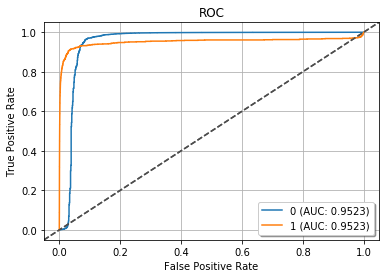

In [9]:
plot_roc(evl_cross, class_index=[0,1], wait=True)

test data set

In [15]:
evl_cross.crossvalidate_model(tree_model, test_instances, 5, Random(1))

In [16]:
print(evl_cross.percent_correct)
print(evl_cross.summary())
print(evl_cross.class_details())

99.11578947368422

Correctly Classified Instances       75328               99.1158 %
Incorrectly Classified Instances       672                0.8842 %
Kappa statistic                          0.7361
Mean absolute error                      0.0118
Root mean squared error                  0.0859
Relative absolute error                 33.0601 %
Root relative squared error             64.464  %
Total Number of Instances            76000     

=== Detailed Accuracy By Class ===

                 TP Rate  FP Rate  Precision  Recall   F-Measure  MCC      ROC Area  PRC Area  Class
                 0.997    0.303    0.994      0.997    0.996      0.738    0.955     0.997     0
                 0.697    0.003    0.789      0.697    0.741      0.738    0.955     0.745     1
Weighted Avg.    0.991    0.297    0.991      0.991    0.991      0.738    0.955     0.993     



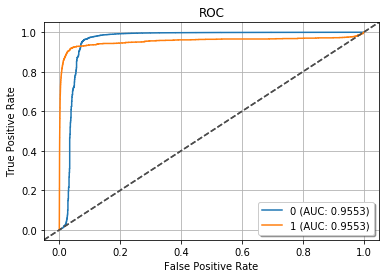

In [17]:
plot_roc(evl_cross, class_index=[0,1], wait=True)

## f. SMOTE

In [11]:
import weka.core.jvm as jvm
jvm.start(packages=True)

DEBUG:weka.core.jvm:Adding bundled jars
DEBUG:weka.core.jvm:Classpath=['d:\\python\\lib\\site-packages\\javabridge\\jars\\rhino-1.7R4.jar', 'd:\\python\\lib\\site-packages\\javabridge\\jars\\runnablequeue.jar', 'd:\\python\\lib\\site-packages\\javabridge\\jars\\cpython.jar', 'd:\\python\\lib\\site-packages\\weka\\lib\\python-weka-wrapper.jar', 'd:\\python\\lib\\site-packages\\weka\\lib\\weka.jar']
DEBUG:weka.core.jvm:MaxHeapSize=default
DEBUG:weka.core.jvm:Package support enabled
DEBUG:javabridge.jutil:Creating JVM object
DEBUG:javabridge.jutil:Signalling caller


In [12]:
import weka.core.converters as converters
from weka.classifiers import Classifier, Evaluation
from weka.plot.classifiers import plot_roc
from weka.core.converters import Loader
from weka.core.classes import Random

In [13]:
loader = Loader()

In [23]:
test_instances = loader.load_file('C:/Users/admin/Desktop/MachineLearning/Machine-Learning/HW/HW3/data/testing_instances.arff')
test_instances.class_is_last()

do cross-validation for choosing k_neighbors in SMOTE:

k_neighbors = 1:

In [14]:
training_instances = loader.load_file('C:/Users/admin/Desktop/MachineLearning/Machine-Learning/HW/HW3/data/training_instances_sm1.arff')
training_instances.class_is_last()

In [15]:
tree_model = Classifier(classname='weka.classifiers.trees.LMT')
tree_model.build_classifier(training_instances)
evl_cross = Evaluation(training_instances)

98.72796610169492

Correctly Classified Instances      116499               98.728  %
Incorrectly Classified Instances      1501                1.272  %
Kappa statistic                          0.9746
Mean absolute error                      0.0201
Root mean squared error                  0.1046
Relative absolute error                  4.0201 %
Root relative squared error             20.9286 %
Total Number of Instances           118000     

=== Detailed Accuracy By Class ===

                 TP Rate  FP Rate  Precision  Recall   F-Measure  MCC      ROC Area  PRC Area  Class
                 0.985    0.011    0.989      0.985    0.987      0.975    0.995     0.995     0
                 0.989    0.015    0.986      0.989    0.987      0.975    0.995     0.992     1
Weighted Avg.    0.987    0.013    0.987      0.987    0.987      0.975    0.995     0.994     



DEBUG:matplotlib.font_manager:findfont: Matching :family=sans-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=12.0 to DejaVu Sans ('D:\\python\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSans.ttf') with score of 0.050000


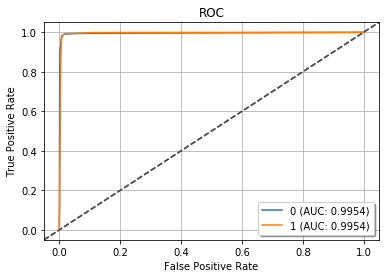

In [16]:
evl_cross.crossvalidate_model(tree_model, training_instances, 5, Random(1))
print(evl_cross.percent_correct)
print(evl_cross.summary())
print(evl_cross.class_details())
plot_roc(evl_cross, class_index=[0,1], wait=True)

K_neighbors = 3:

In [18]:
training_instances = loader.load_file('C:/Users/admin/Desktop/MachineLearning/Machine-Learning/HW/HW3/data/training_instances_sm3.arff')
training_instances.class_is_last()

98.44661016949152

Correctly Classified Instances      116167               98.4466 %
Incorrectly Classified Instances      1833                1.5534 %
Kappa statistic                          0.9689
Mean absolute error                      0.0268
Root mean squared error                  0.1152
Relative absolute error                  5.3559 %
Root relative squared error             23.0365 %
Total Number of Instances           118000     

=== Detailed Accuracy By Class ===

                 TP Rate  FP Rate  Precision  Recall   F-Measure  MCC      ROC Area  PRC Area  Class
                 0.983    0.014    0.986      0.983    0.984      0.969    0.996     0.996     0
                 0.986    0.017    0.983      0.986    0.984      0.969    0.996     0.994     1
Weighted Avg.    0.984    0.016    0.984      0.984    0.984      0.969    0.996     0.995     



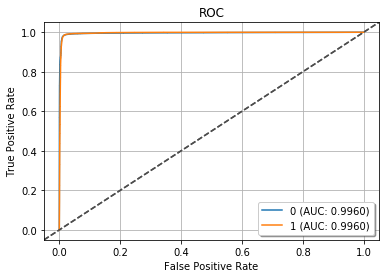

In [19]:
tree_model = Classifier(classname='weka.classifiers.trees.LMT')
tree_model.build_classifier(training_instances)
evl_cross = Evaluation(training_instances)
evl_cross.crossvalidate_model(tree_model, training_instances, 5, Random(1))
print(evl_cross.percent_correct)
print(evl_cross.summary())
print(evl_cross.class_details())
plot_roc(evl_cross, class_index=[0,1], wait=True)

K_neighbors = 5:

In [21]:
training_instances = loader.load_file('C:/Users/admin/Desktop/MachineLearning/Machine-Learning/HW/HW3/data/training_instances_sm5.arff')
training_instances.class_is_last()

98.37796610169491

Correctly Classified Instances      116086               98.378  %
Incorrectly Classified Instances      1914                1.622  %
Kappa statistic                          0.9676
Mean absolute error                      0.0274
Root mean squared error                  0.1166
Relative absolute error                  5.4792 %
Root relative squared error             23.3285 %
Total Number of Instances           118000     

=== Detailed Accuracy By Class ===

                 TP Rate  FP Rate  Precision  Recall   F-Measure  MCC      ROC Area  PRC Area  Class
                 0.983    0.015    0.985      0.983    0.984      0.968    0.996     0.995     0
                 0.985    0.017    0.983      0.985    0.984      0.968    0.996     0.994     1
Weighted Avg.    0.984    0.016    0.984      0.984    0.984      0.968    0.996     0.994     



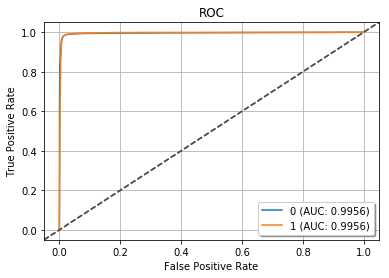

In [22]:
tree_model = Classifier(classname='weka.classifiers.trees.LMT')
tree_model.build_classifier(training_instances)
evl_cross = Evaluation(training_instances)
evl_cross.crossvalidate_model(tree_model, training_instances, 5, Random(1))
print(evl_cross.percent_correct)
print(evl_cross.summary())
print(evl_cross.class_details())
plot_roc(evl_cross, class_index=[0,1], wait=True)

In [42]:
test_predict_y = evl_cross.test_model(tree_model, test_instances)

In [51]:
test_matrix_new = confusion_matrix(test_data_y_1D, test_predict_y)

[[15362   263]
 [   55   320]]


Text(0.5,0,'Predicted label')

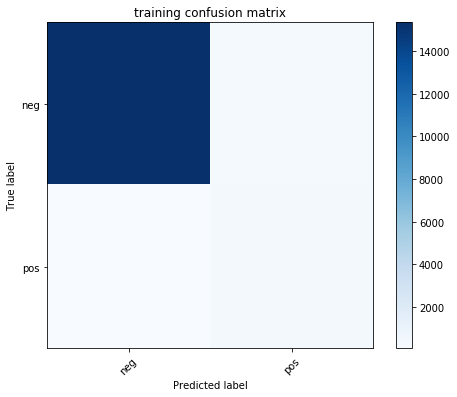

In [52]:
plt.figure(num=20, figsize=(8,6))
print(test_matrix_new)
plt.imshow(test_matrix_new, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('training confusion matrix')
plt.colorbar()
classes=["neg","pos"]
tick_marks=np.arange(len(classes))
plt.xticks(tick_marks,classes,rotation=45)
plt.yticks(tick_marks,classes)
plt.ylabel('True label')
plt.xlabel('Predicted label')

In [53]:
fpr_test, tpr_test, thresholds_test = roc_curve(test_data_y_1D, test_predict_y)
roc_auc_test = auc(fpr_test,tpr_test)

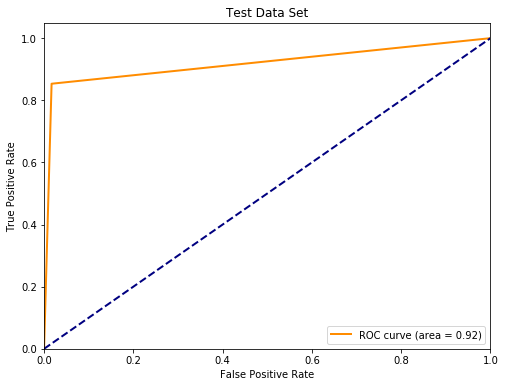

In [54]:
plt.figure(num=21, figsize=(8,6))
plt.plot(fpr_test, tpr_test, color='darkorange',
         lw=2, label='ROC curve (area = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Test Data Set')
plt.legend(loc="lower right")
plt.show()

K_neighbors = 8:

In [55]:
training_instances = loader.load_file('C:/Users/admin/Desktop/MachineLearning/Machine-Learning/HW/HW3/data/training_instances_sm8.arff')
training_instances.class_is_last()

98.84322033898304

Correctly Classified Instances      116635               98.8432 %
Incorrectly Classified Instances      1365                1.1568 %
Kappa statistic                          0.9769
Mean absolute error                      0.0188
Root mean squared error                  0.1003
Relative absolute error                  3.7501 %
Root relative squared error             20.0616 %
Total Number of Instances           118000     

=== Detailed Accuracy By Class ===

                 TP Rate  FP Rate  Precision  Recall   F-Measure  MCC      ROC Area  PRC Area  Class
                 0.985    0.008    0.992      0.985    0.988      0.977    0.996     0.996     0
                 0.992    0.015    0.985      0.992    0.988      0.977    0.996     0.993     1
Weighted Avg.    0.988    0.012    0.988      0.988    0.988      0.977    0.996     0.995     



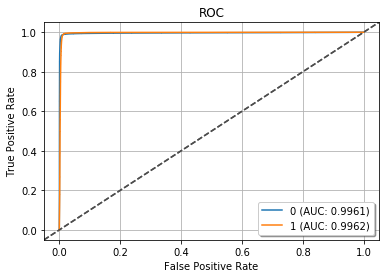

In [56]:
tree_model = Classifier(classname='weka.classifiers.trees.LMT')
tree_model.build_classifier(training_instances)
evl_cross = Evaluation(training_instances)
evl_cross.crossvalidate_model(tree_model, training_instances, 5, Random(1))
print(evl_cross.percent_correct)
print(evl_cross.summary())
print(evl_cross.class_details())
plot_roc(evl_cross, class_index=[0,1], wait=True)

[[58607   393]
 [   19   981]]


Text(0.5,0,'Predicted label')

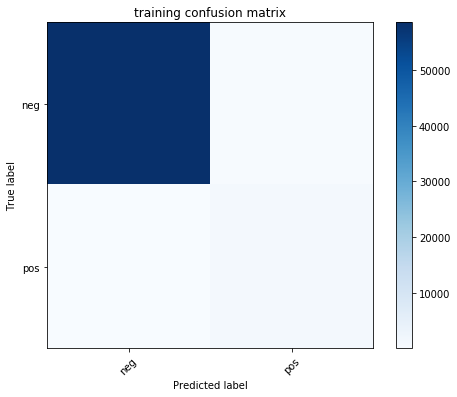

In [61]:
train_predict_y = evl_cross.test_model(tree_model, training_instances)
train_matrix_new = confusion_matrix(training_data_y_1D, train_predict_y)
plt.figure(num=24, figsize=(8,6))
print(train_matrix_new)
plt.imshow(train_matrix_new, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('training confusion matrix')
plt.colorbar()
classes=["neg","pos"]
tick_marks=np.arange(len(classes))
plt.xticks(tick_marks,classes,rotation=45)
plt.yticks(tick_marks,classes)
plt.ylabel('True label')
plt.xlabel('Predicted label')

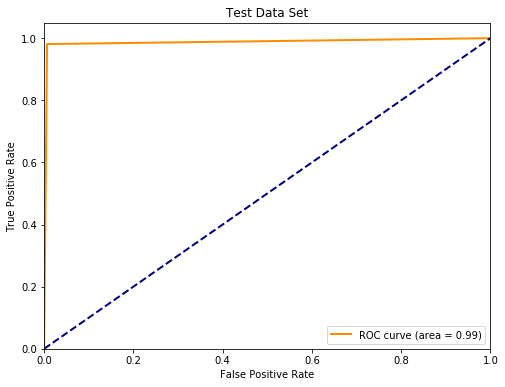

In [63]:
fpr_test, tpr_test, thresholds_test = roc_curve(training_data_y_1D, train_predict_y)
roc_auc_test = auc(fpr_test,tpr_test)
plt.figure(num=23, figsize=(8,6))
plt.plot(fpr_test, tpr_test, color='darkorange',
         lw=2, label='ROC curve (area = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Test Data Set')
plt.legend(loc="lower right")
plt.show()

[[15431   194]
 [   68   307]]


Text(0.5,0,'Predicted label')

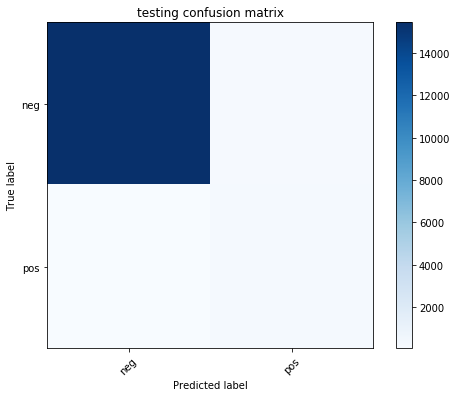

In [59]:
test_predict_y = evl_cross.test_model(tree_model, test_instances)
test_matrix_new = confusion_matrix(test_data_y_1D, test_predict_y)
plt.figure(num=22, figsize=(8,6))
print(test_matrix_new)
plt.imshow(test_matrix_new, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('testing confusion matrix')
plt.colorbar()
classes=["neg","pos"]
tick_marks=np.arange(len(classes))
plt.xticks(tick_marks,classes,rotation=45)
plt.yticks(tick_marks,classes)
plt.ylabel('True label')
plt.xlabel('Predicted label')

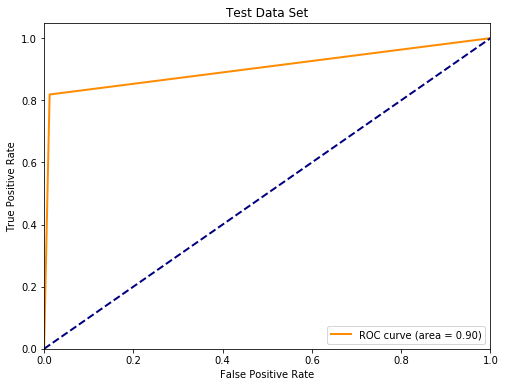

In [58]:
fpr_test, tpr_test, thresholds_test = roc_curve(test_data_y_1D, test_predict_y)
roc_auc_test = auc(fpr_test,tpr_test)
plt.figure(num=23, figsize=(8,6))
plt.plot(fpr_test, tpr_test, color='darkorange',
         lw=2, label='ROC curve (area = %0.2f)' % roc_auc_test)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Test Data Set')
plt.legend(loc="lower right")
plt.show()

### conclusion:

It takes about 5 hours to build a model tree with a specific k_neighbor coefficient. As far as I have calculated, from the cross-validation result, the best k_neighbor is 8. The 5-folds cross validation error is 1.1568 %. The training error is 0.6870%. The test error is 1.6375%.

# ISLR 9.7.3

### a.

Text(0,0.5,'X2')

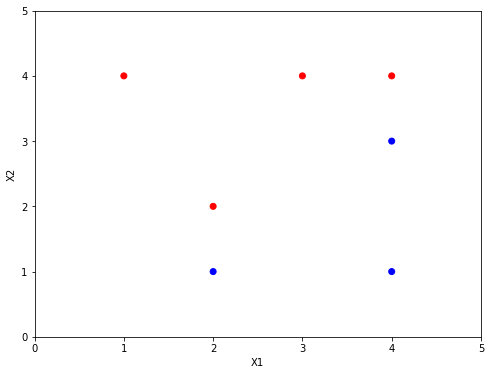

In [5]:
x1 = [3,2,4,1,2,4,4]
x2 = [4,2,4,4,1,3,1]
colors = ['r','r','r','r','b','b','b']
plt.figure(num=12, figsize=(8,6))
plt.scatter(x1,x2,c=colors)
plt.xlim(0,5)
plt.ylim(0,5)
plt.xlabel('X1')
plt.ylabel('X2')

### b.

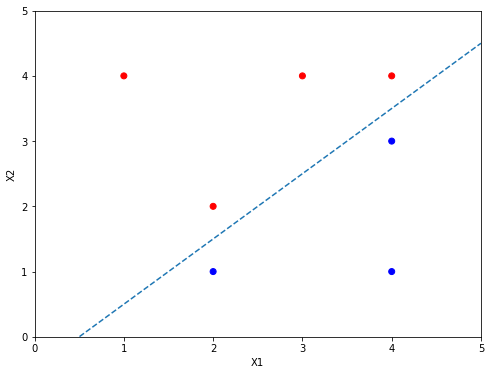

In [7]:
plt.figure(num=13, figsize=(8,6))
plt.scatter(x1,x2,c=colors)
plt.xlim(0,5)
plt.ylim(0,5)
plt.xlabel('X1')
plt.ylabel('X2')
axes = plt.gca()
x_vals = np.array(axes.get_xlim())
y_vals = -0.5 + 1 * x_vals
plt.plot(x_vals, y_vals, '--')

### c.

The classification rule is above the line will be red, and below the line is blue.

### d.

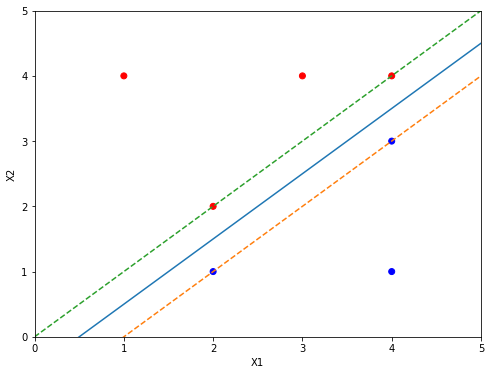

In [8]:
plt.figure(num=14, figsize=(8,6))
plt.scatter(x1,x2,c=colors)
plt.xlim(0,5)
plt.ylim(0,5)
plt.xlabel('X1')
plt.ylabel('X2')
axes = plt.gca()
x_vals = np.array(axes.get_xlim())
y_vals = -0.5 + 1 * x_vals
plt.plot(x_vals, y_vals, '-')

axes = plt.gca()
x_vals = np.array(axes.get_xlim())
y_vals = -1 + 1 * x_vals
plt.plot(x_vals, y_vals, '--')

axes = plt.gca()
x_vals = np.array(axes.get_xlim())
y_vals = 0 + 1 * x_vals
plt.plot(x_vals, y_vals, '--')

### e.

The support vetors are (2,1), (2,2), (4,3), (4,4).

### f.

The movement of the seventh observation will not affect because it is not a support vector.

### g.

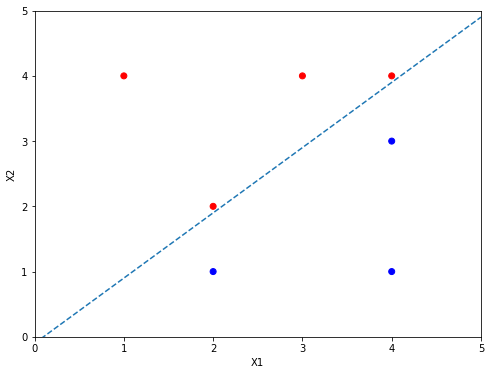

In [9]:
plt.figure(num=15, figsize=(8,6))
plt.scatter(x1,x2,c=colors)
plt.xlim(0,5)
plt.ylim(0,5)
plt.xlabel('X1')
plt.ylabel('X2')
axes = plt.gca()
x_vals = np.array(axes.get_xlim())
y_vals = -0.1 + 1 * x_vals
plt.plot(x_vals, y_vals, '--')

X1 - X2 - 0.1 = 0

### h.

Text(0,0.5,'X2')

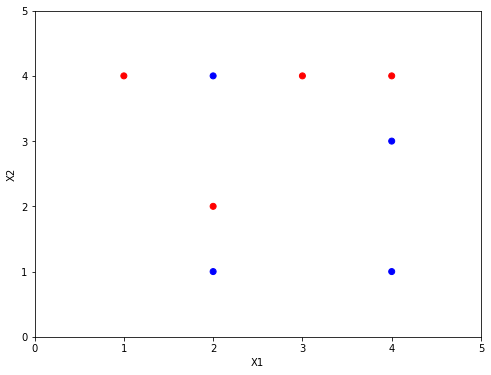

In [10]:
x1_new = [3,2,4,1,2,4,4,2]
x2_new = [4,2,4,4,1,3,1,4]
colors = ['r','r','r','r','b','b','b','b']
plt.figure(num=12, figsize=(8,6))
plt.scatter(x1_new,x2_new,c=colors)
plt.xlim(0,5)
plt.ylim(0,5)
plt.xlabel('X1')
plt.ylabel('X2')

Add the new blue point (2,4).